In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
import yfinance as yf

sns.set_style('darkgrid')
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from math import sqrt

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.metrics import mean_squared_error

from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from pmdarima import auto_arima
from statsmodels.graphics.tsaplots import month_plot, quarter_plot
import warnings

warnings.filterwarnings("ignore")

/Users/nirmolcho/opt/anaconda3/final_task_df/lib/python3.9/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
df = pd.read_csv('final_s&p500_df.csv')

In [3]:
df

,Ticker,Date,Open,High,Low,Close,Adj Close,Volume,Holder,Date_Holder_bought_stock,Holder_%_in_company,Industry,Dividend_Value
0,CSCO,2020-01-02,48.060001,48.419998,47.880001,48.419998,43.408047,16708100,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
1,CSCO,2020-01-03,47.910000,48.139999,47.480000,47.630001,42.699821,15577400,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
2,CSCO,2020-01-06,47.139999,47.820000,47.009998,47.799999,42.852222,22183600,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
3,CSCO,2020-01-07,47.720001,47.720001,47.099998,47.490002,42.574314,16501900,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
4,CSCO,2020-01-08,46.970001,47.790001,46.810001,47.520000,42.601200,25175900,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
378552,PPL,2022-12-23,29.100000,29.580000,29.100000,29.540001,29.017178,2448300,Vanguard Group Inc,2023-06-29,0.1283,NaN,0.0
378553,PPL,2022-12-27,29.620001,29.780001,29.430000,29.690001,29.164522,1967600,Vanguard Group Inc,2023-06-29,0.1283,NaN,0.0
378554,PPL,2022-12-28,29.730000,29.920000,29.400000,29.440001,28.918947,4268100,Vanguard Group Inc,2023-06-29,0.1283,NaN,0.0
378555,PPL,2022-12-29,29.600000,29.760000,29.510000,29.660000,29.135054,2104100,Vanguard Group Inc,2023-06-29,0.1283,NaN,0.0


In [4]:
df['Ticker'].value_counts()

Ticker
CSCO    756
JPM     756
DHR     756
COP     756
ATO     756
       ... 
CARR    703
OTIS    703
OGN     412
CEG     240
GEHC     11
Name: count, Length: 503, dtype: int64

In [5]:
top_15_tickers = df['Ticker'].value_counts().head(15).index

In [6]:
new_df = pd.DataFrame()
for ticker in top_15_tickers:
    ticker_df = df[df['Ticker'] == ticker]
    new_df = pd.concat([new_df, ticker_df])
    

In [7]:
new_df

,Ticker,Date,Open,High,Low,Close,Adj Close,Volume,Holder,Date_Holder_bought_stock,Holder_%_in_company,Industry,Dividend_Value
0,CSCO,2020-01-02,48.060001,48.419998,47.880001,48.419998,43.408047,16708100,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
1,CSCO,2020-01-03,47.910000,48.139999,47.480000,47.630001,42.699821,15577400,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
2,CSCO,2020-01-06,47.139999,47.820000,47.009998,47.799999,42.852222,22183600,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
3,CSCO,2020-01-07,47.720001,47.720001,47.099998,47.490002,42.574314,16501900,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
4,CSCO,2020-01-08,46.970001,47.790001,46.810001,47.520000,42.601200,25175900,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
249142,ABT,2022-12-23,107.669998,108.400002,107.099998,108.180000,106.645416,2618400,Vanguard Group Inc,2023-06-29,0.0897,Medical Devices,0.0
249143,ABT,2022-12-27,108.349998,109.050003,107.379997,108.570000,107.029884,2927400,Vanguard Group Inc,2023-06-29,0.0897,Medical Devices,0.0
249144,ABT,2022-12-28,109.019997,110.099998,107.739998,107.830002,106.300385,3265200,Vanguard Group Inc,2023-06-29,0.0897,Medical Devices,0.0
249145,ABT,2022-12-29,108.750000,110.760002,108.459999,110.309998,108.745201,3047800,Vanguard Group Inc,2023-06-29,0.0897,Medical Devices,0.0


In [8]:
new_df['Date'] = pd.to_datetime(new_df['Date'])
new_df.set_index('Date', inplace=True)

In [9]:
new_df

,Ticker,Open,High,Low,Close,Adj Close,Volume,Holder,Date_Holder_bought_stock,Holder_%_in_company,Industry,Dividend_Value
Date,,,,,,,,,,,,
2020-01-02,CSCO,48.060001,48.419998,47.880001,48.419998,43.408047,16708100,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
2020-01-03,CSCO,47.910000,48.139999,47.480000,47.630001,42.699821,15577400,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
2020-01-06,CSCO,47.139999,47.820000,47.009998,47.799999,42.852222,22183600,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
2020-01-07,CSCO,47.720001,47.720001,47.099998,47.490002,42.574314,16501900,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
2020-01-08,CSCO,46.970001,47.790001,46.810001,47.520000,42.601200,25175900,Vanguard Group Inc,2023-06-29,NaN,Communication Equipment,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,ABT,107.669998,108.400002,107.099998,108.180000,106.645416,2618400,Vanguard Group Inc,2023-06-29,0.0897,Medical Devices,0.0
2022-12-27,ABT,108.349998,109.050003,107.379997,108.570000,107.029884,2927400,Vanguard Group Inc,2023-06-29,0.0897,Medical Devices,0.0
2022-12-28,ABT,109.019997,110.099998,107.739998,107.830002,106.300385,3265200,Vanguard Group Inc,2023-06-29,0.0897,Medical Devices,0.0


In [10]:
new_df = new_df[['Close','Ticker']]

In [11]:
new_df.to_csv('top_15_tickers.csv')

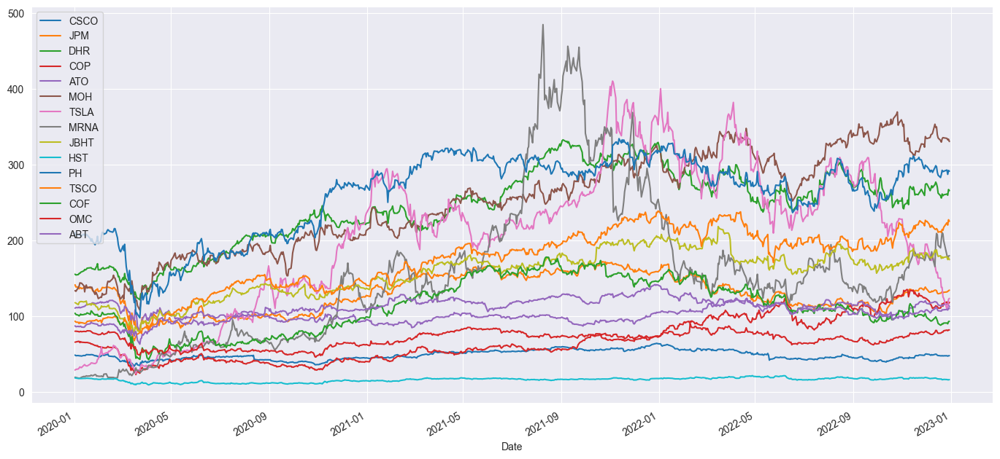

In [12]:
for ticker in top_15_tickers:
    ticker_df = new_df[new_df['Ticker'] == ticker]
    ticker_df['Close'].plot(figsize=(17,8), label=ticker)
    plt.legend()

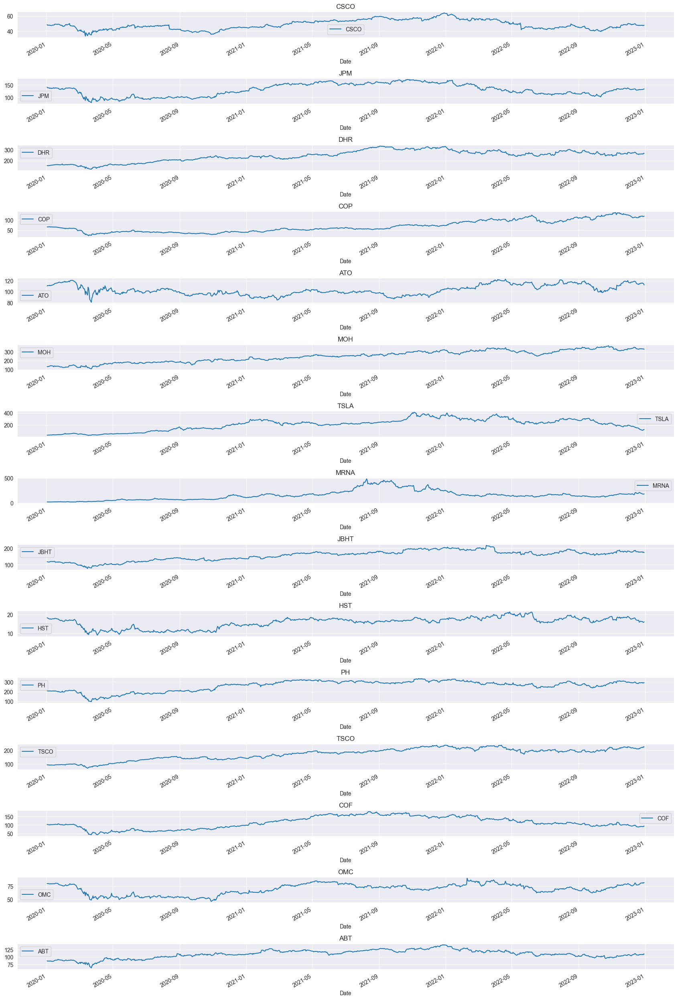

In [26]:
top_15_tickers = unique_tickers

plt.figure(figsize=(17, 25))

for i, ticker in enumerate(top_15_tickers, 1):
    plt.subplot(len(top_15_tickers), 1, i)
    
    ticker_df = new_combined_df[new_combined_df['Ticker'] == ticker]
    ticker_df['Close'].plot(label=ticker)
    
    plt.title(ticker)
    plt.legend()

plt.tight_layout()
plt.show()


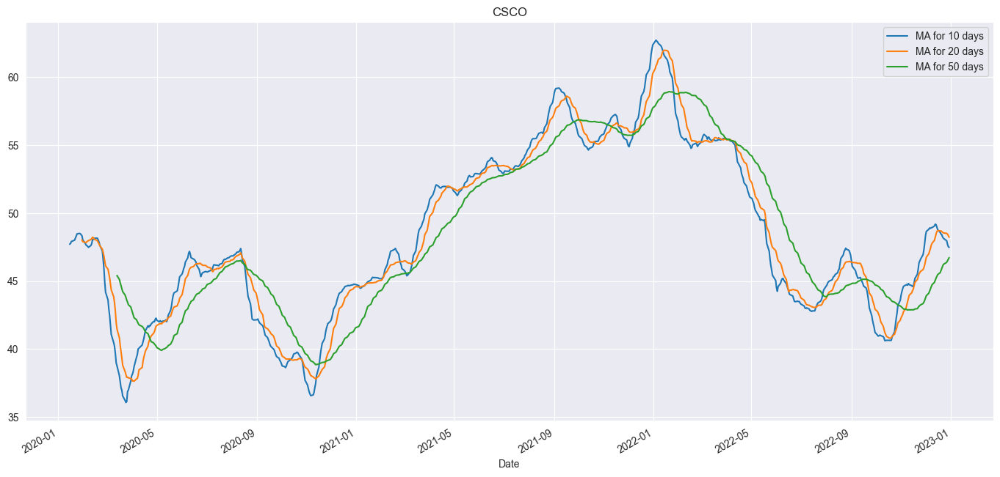

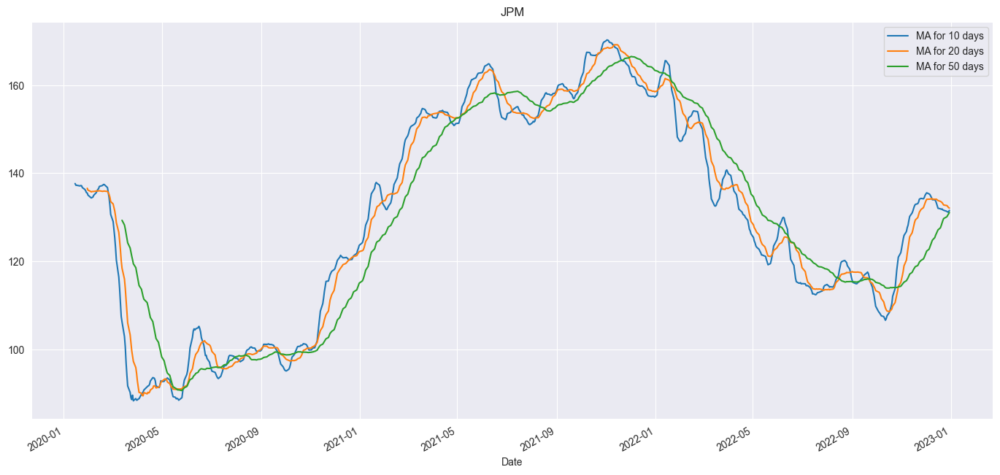

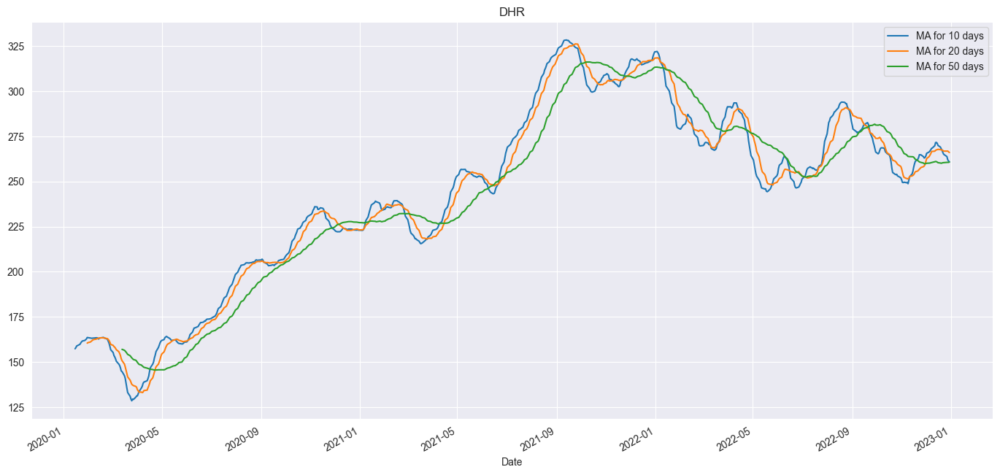

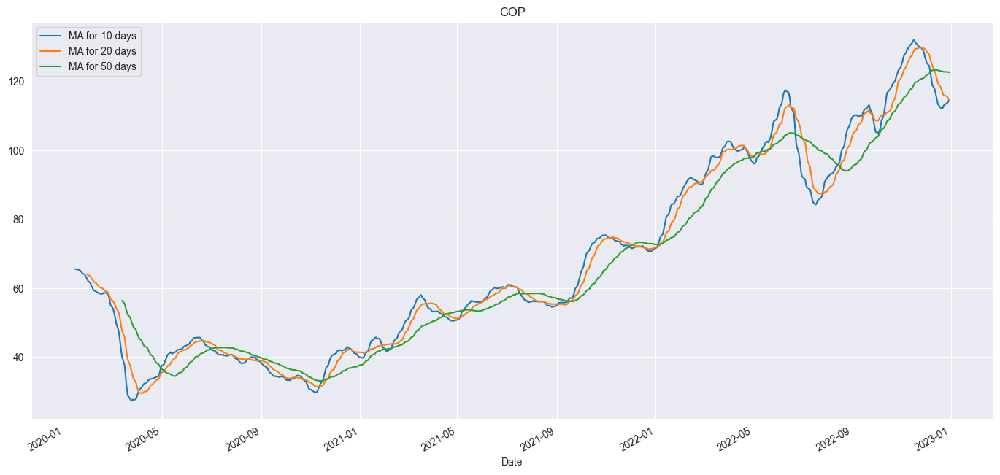

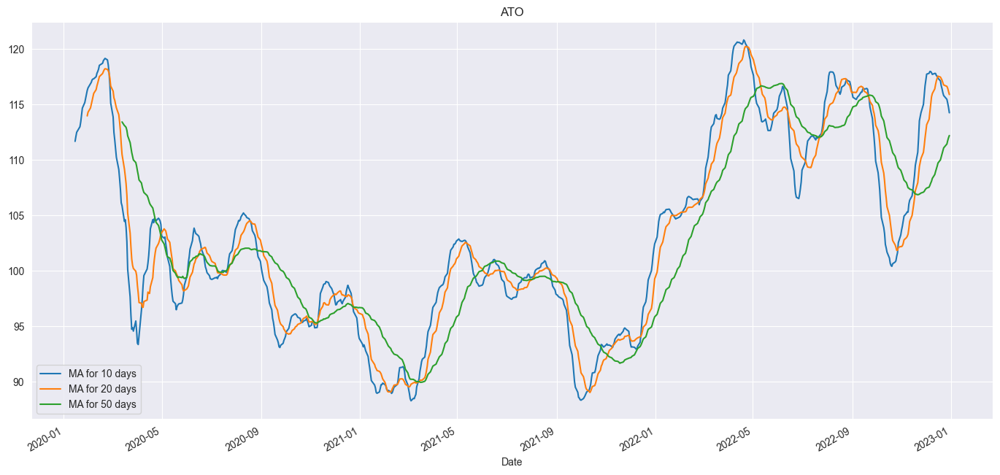

...

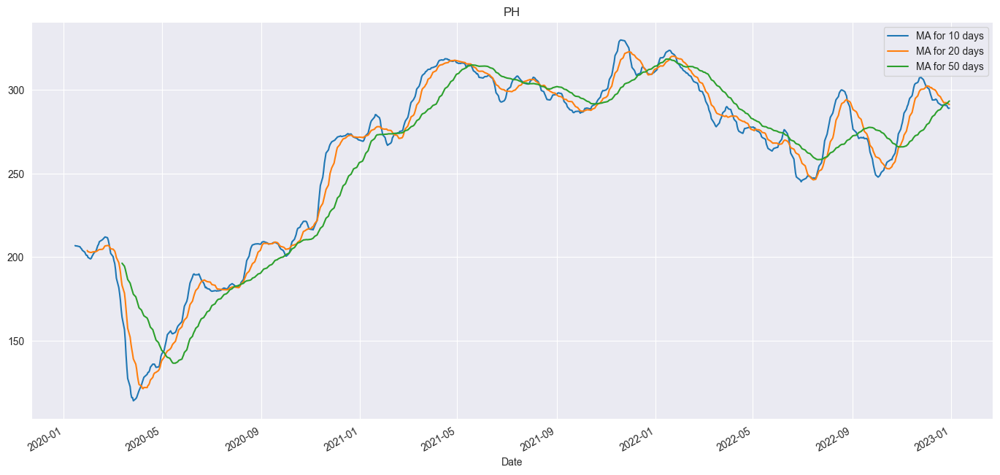

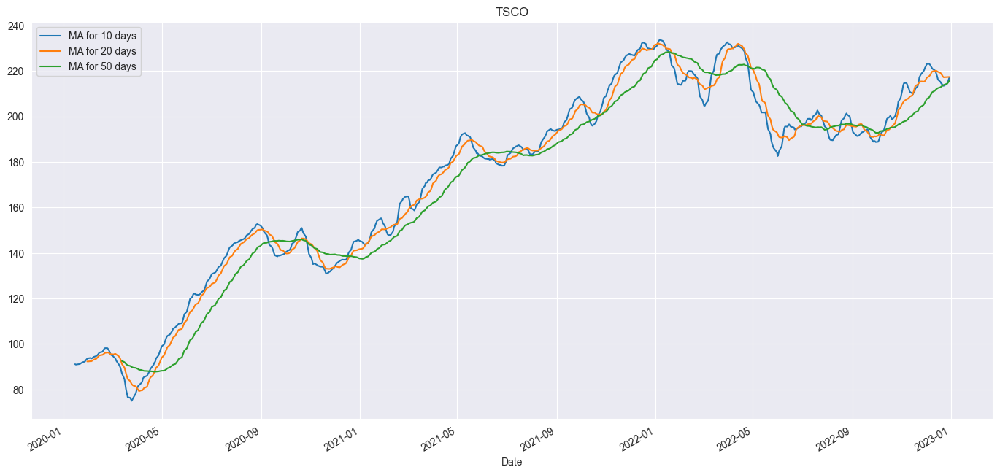

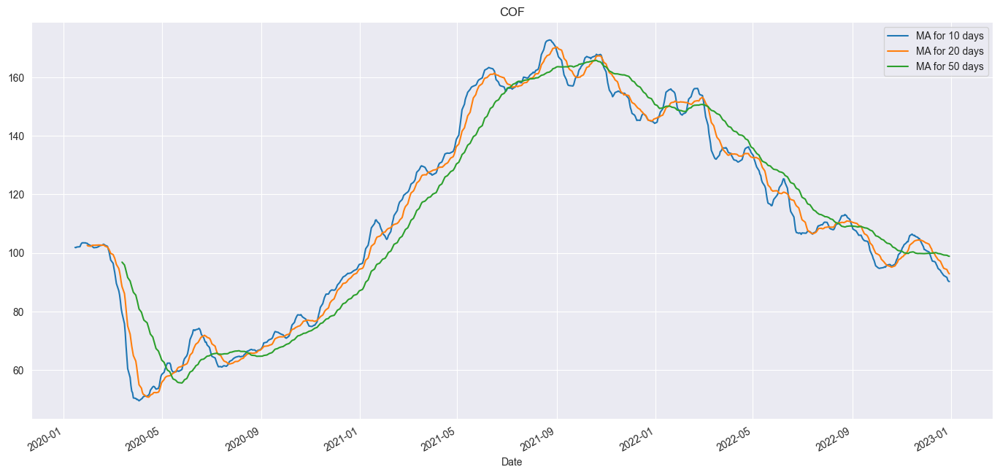

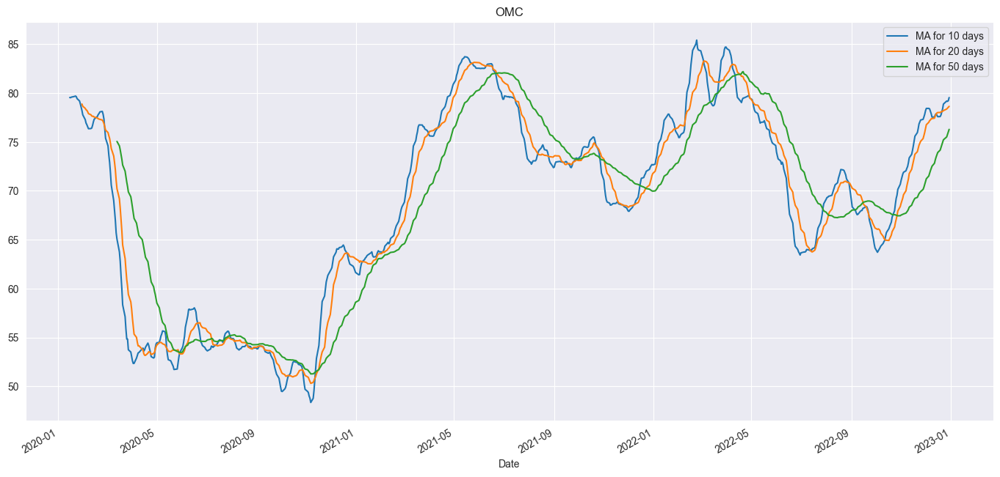

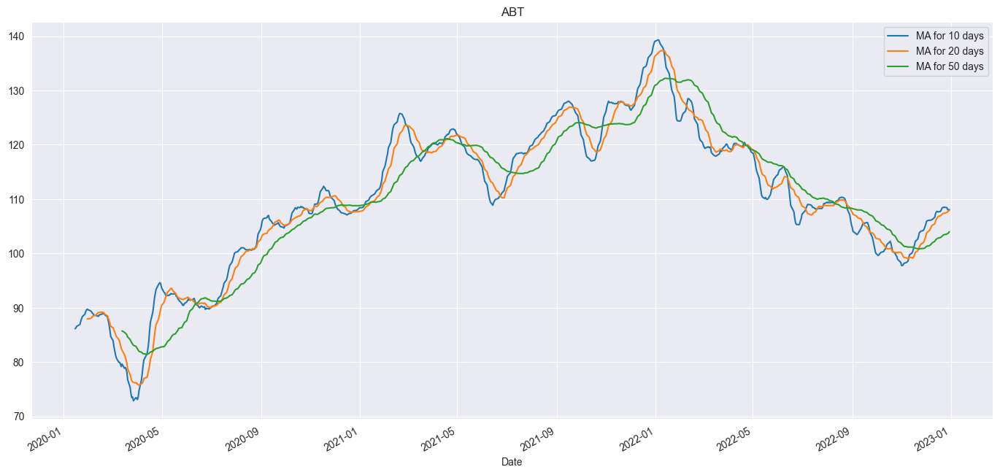

In [13]:
ma_day = [10, 20, 50]
all_tickers_data = []  

for ticker in top_15_tickers:
    ticker_df = new_df[new_df['Ticker'] == ticker].copy()  
    
    for ma in ma_day:
        ticker_df['MA for {} days'.format(ma)] = ticker_df['Close'].rolling(ma).mean()
        
    all_tickers_data.append(ticker_df)  

    plt.figure(figsize=(17, 8))
    plt.title(ticker)
    
    for ma in ma_day:
        ticker_df['MA for {} days'.format(ma)].plot(label='MA for {} days'.format(ma))
        
    plt.legend()
    plt.show()

new_combined_df = pd.concat(all_tickers_data)

In [14]:
new_combined_df.drop(['MA for 10 days', 'MA for 20 days', 'MA for 50 days'], axis=1, inplace=True)

#  ARIMA Model

ARIMA (AutoRegressive Integrated Moving Average) model is a prominent time series forecasting technique, and it has found extensive applications in stock market analysis. In essence, ARIMA combines three main components: AutoRegressive (AR), Integrated (I), and Moving Average (MA). The AR component examines the relationship between an observation and a number of lagged observations (previous time points). The I component signifies the number of differences required to make the time series stationary, i.e., to have constant mean and variance over time. This is essential because many time series models, including ARIMA, require the data to be stationary. Lastly, the MA component models the error term as a linear combination of error terms from previous time points. In stock market analysis, ARIMA can be used to predict future stock prices based on historical data. 

In [19]:
new_combined_df

,Close,Ticker
Date,,
2020-01-02,48.419998,CSCO
2020-01-03,47.630001,CSCO
2020-01-06,47.799999,CSCO
2020-01-07,47.490002,CSCO
2020-01-08,47.520000,CSCO
...,...,...
2022-12-23,108.180000,ABT
2022-12-27,108.570000,ABT
2022-12-28,107.830002,ABT


In [20]:
unique_tickers = new_combined_df['Ticker'].unique()
unique_tickers

array(['CSCO', 'JPM', 'DHR', 'COP', 'ATO', 'MOH', 'TSLA', 'MRNA', 'JBHT',
       'HST', 'PH', 'TSCO', 'COF', 'OMC', 'ABT'], dtype=object)

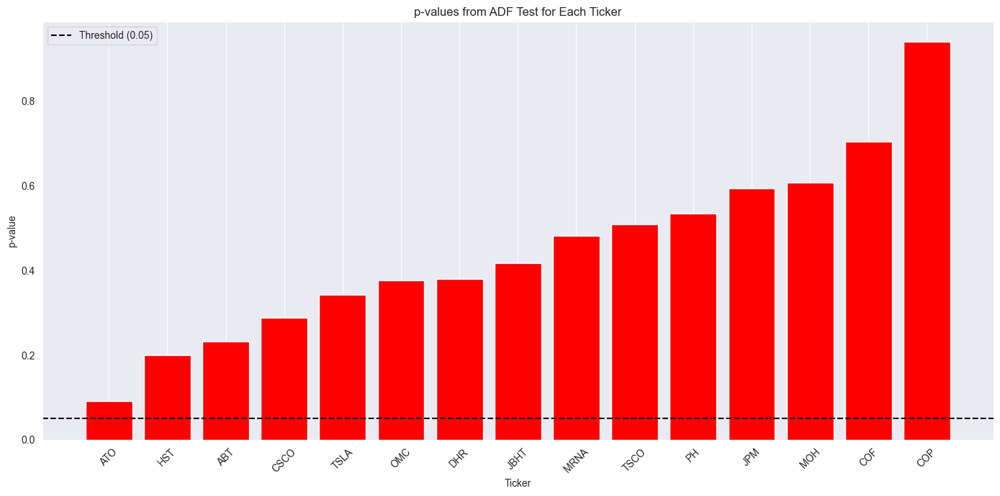

In [25]:
p_values = {}
for ticker in unique_tickers:
    ticker_data = new_combined_df[new_combined_df['Ticker'] == ticker]['Close'].values
    result = adfuller(ticker_data)
    p_value = result[1]
    p_values[ticker] = p_value

sorted_p_values = dict(sorted(p_values.items(), key=lambda item: item[1]))

plt.figure(figsize=(14,7))
bars = plt.bar(sorted_p_values.keys(), sorted_p_values.values(), color=['green' if p < 0.05 else 'red' for p in sorted_p_values.values()])
plt.axhline(y=0.05, color='black', linestyle='--', label='Threshold (0.05)')
plt.xlabel('Ticker')
plt.ylabel('p-value')
plt.title('p-values from ADF Test for Each Ticker')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(axis='y')
plt.show()


In [22]:
mse_dict_adjusted = {}

for ticker in unique_tickers:
    ticker_data = new_combined_df[new_combined_df['Ticker'] == ticker]['Close'].values    
    train_size = int(len(ticker_data) * 0.8)
    train, test = ticker_data[:train_size], ticker_data[train_size:]
    model = ARIMA(train, order=(5,1,0))
    model_fit = model.fit()
    single_prediction = model_fit.forecast(steps=len(test))[0]
    predictions_array = np.full(len(test), single_prediction)
    mse = mean_squared_error(test, predictions_array)
    mse_dict_adjusted[ticker] = mse

mse_dict_adjusted

{'CSCO': 7.54920057356837,
 'JPM': 120.66775339980278,
 'DHR': 427.1849798993321,
 'COP': 188.1403445265345,
 'ATO': 45.812816143551714,
 'MOH': 854.1681381203199,
 'TSLA': 3065.7047660739568,
 'MRNA': 1073.9490422196266,
 'JBHT': 235.60444313231582,
 'HST': 2.8019858014597205,
 'PH': 593.3535297537749,
 'TSCO': 1099.666312732838,
 'COF': 241.18238694697303,
 'OMC': 28.276433019906914,
 'ABT': 86.39354033397393}

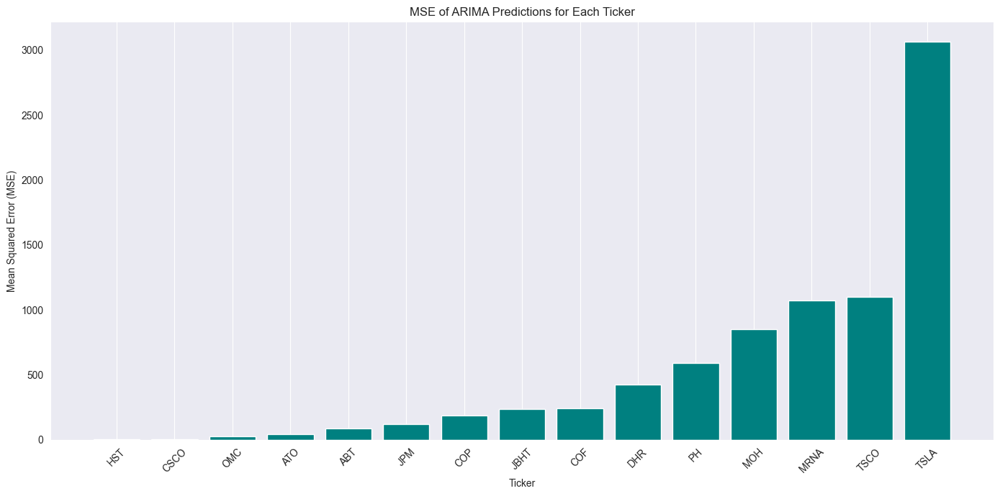

In [23]:
sorted_mse = dict(sorted(mse_dict_adjusted.items(), key=lambda item: item[1]))

plt.figure(figsize=(14,7))
plt.bar(sorted_mse.keys(), sorted_mse.values(), color='teal')
plt.xlabel('Ticker')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('MSE of ARIMA Predictions for Each Ticker')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(axis='y')
plt.show()

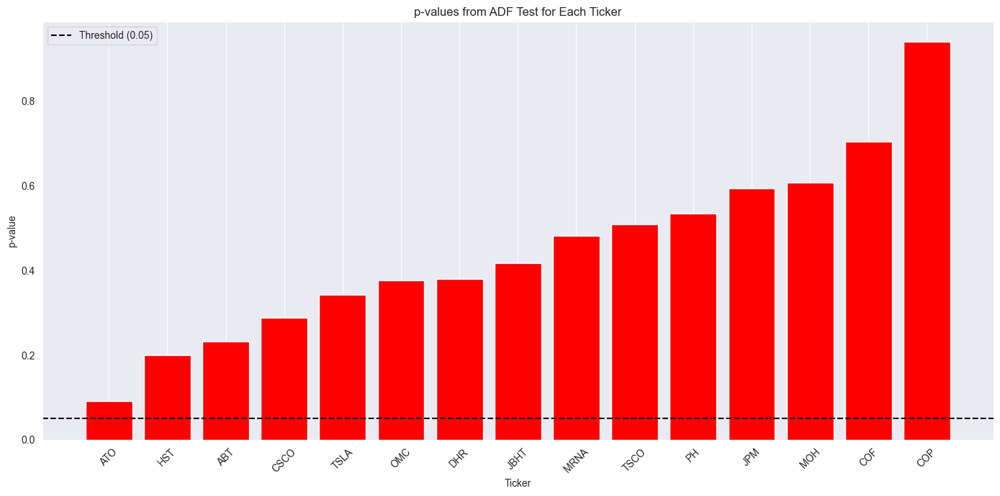

In [24]:
p_values = {}

for ticker in unique_tickers:
    ticker_data = new_combined_df[new_combined_df['Ticker'] == ticker]['Close'].values
    
    result = adfuller(ticker_data)
    p_value = result[1]
    
    p_values[ticker] = p_value

sorted_p_values = dict(sorted(p_values.items(), key=lambda item: item[1]))

plt.figure(figsize=(14,7))
bars = plt.bar(sorted_p_values.keys(), sorted_p_values.values(), color=['green' if p < 0.05 else 'red' for p in sorted_p_values.values()])
plt.axhline(y=0.05, color='black', linestyle='--', label='Threshold (0.05)')
plt.xlabel('Ticker')
plt.ylabel('p-value')
plt.title('p-values from ADF Test for Each Ticker')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(axis='y')
plt.show()


#  Model Grach 

The GARCH (Generalized AutoRegressive Conditional Heteroskedasticity) model is another vital time series analysis tool, particularly relevant for financial data where volatility plays a significant role. GARCH is designed to model and predict volatility, which is a measure of the dispersion of returns for a given security or market index.

In [54]:
data = pd.read_csv('new_combined_df.csv')

In [55]:
data['Returns'] = data.groupby('Ticker')['Close'].pct_change()
data.head()

,Date,Close,Ticker,MA for 10 days,MA for 20 days,MA for 50 days,Returns
0,2020-01-02,48.419998,CSCO,NaN,NaN,NaN,NaN
1,2020-01-03,47.630001,CSCO,NaN,NaN,NaN,-0.016316
2,2020-01-06,47.799999,CSCO,NaN,NaN,NaN,0.003569
3,2020-01-07,47.490002,CSCO,NaN,NaN,NaN,-0.006485
4,2020-01-08,47.520000,CSCO,NaN,NaN,NaN,0.000632


In [58]:
from arch import arch_model
tickers = data['Ticker'].unique()
garch_results = {}

for ticker in tickers:
    ticker_data = data[data['Ticker'] == ticker].dropna()
    model = arch_model(ticker_data['Returns'], vol='Garch', p=1, q=1)
    results = model.fit(disp='off')
    garch_results[ticker] = results

garch_results[tickers[0]].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:                Returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                1887.95
Distribution:                  Normal   AIC:                          -3767.90
Method:            Maximum Likelihood   BIC:                          -3749.66
                                        No. Observations:                  707
Date:                Thu, Aug 24 2023   Df Residuals:                      706
Time:                        21:30:30   Df Model:                            1
                                  Mean Model                                 
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu         4.0111e-04  6.832e-04      0.587      0.557 [-9.380e-04,1.740e-03]
                              Volatility Model                              
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      3.6334e-05  1.072e-05      3.391  6.965e-04 [1.533e-05,5.734e-05]
alpha[1]       0.2000      0.273      0.732      0.464     [ -0.336,  0.736]
beta[1]        0.7000      0.218      3.216  1.299e-03     [  0.273,  1.127]
============================================================================

Covariance estimator: robust
"""

In [59]:
garch_results

{'CSCO':                      Constant Mean - GARCH Model Results                      
 Dep. Variable:                Returns   R-squared:                       0.000
 Mean Model:             Constant Mean   Adj. R-squared:                  0.000
 Vol Model:                      GARCH   Log-Likelihood:                1887.95
 Distribution:                  Normal   AIC:                          -3767.90
 Method:            Maximum Likelihood   BIC:                          -3749.66
                                         No. Observations:                  707
 Date:                Thu, Aug 24 2023   Df Residuals:                      706
 Time:                        21:30:30   Df Model:                            1
                                   Mean Model                                 
                  coef    std err          t      P>|t|       95.0% Conf. Int.
 -----------------------------------------------------------------------------
 mu         4.0111e-04  6.832e-04  

In [60]:
average_daily_returns = data.groupby('Ticker')['Returns'].mean()
annualized_returns = (1 + average_daily_returns) ** 252 - 1
ranked_tickers = annualized_returns.sort_values(ascending=False)
ranked_tickers

Ticker
MRNA    2.019725
TSLA    1.108462
MOH     0.462797
TSCO    0.422603
COP     0.400961
DHR     0.254172
PH      0.217575
JBHT    0.210340
ABT     0.130656
COF     0.103144
HST     0.081780
OMC     0.078238
JPM     0.056217
ATO     0.050536
CSCO    0.045602
Name: Returns, dtype: float64

In [64]:
ranked_tickers.tail(1)

Ticker
CSCO    0.045602
Name: Returns, dtype: float64

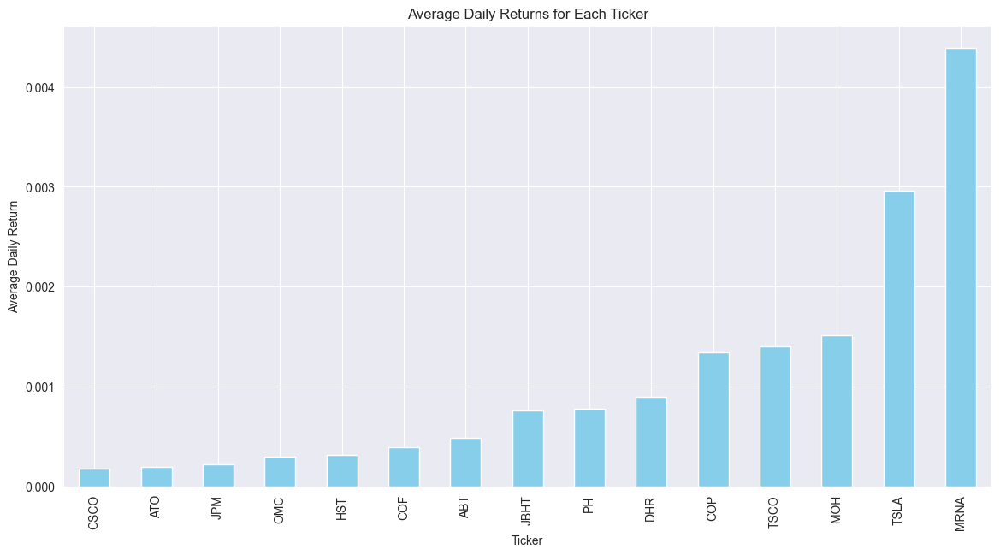

In [65]:
plt.figure(figsize=(14, 7))
average_daily_returns.sort_values().plot(kind='bar', color='skyblue')
plt.title('Average Daily Returns for Each Ticker')
plt.xlabel('Ticker')
plt.ylabel('Average Daily Return')
plt.show()

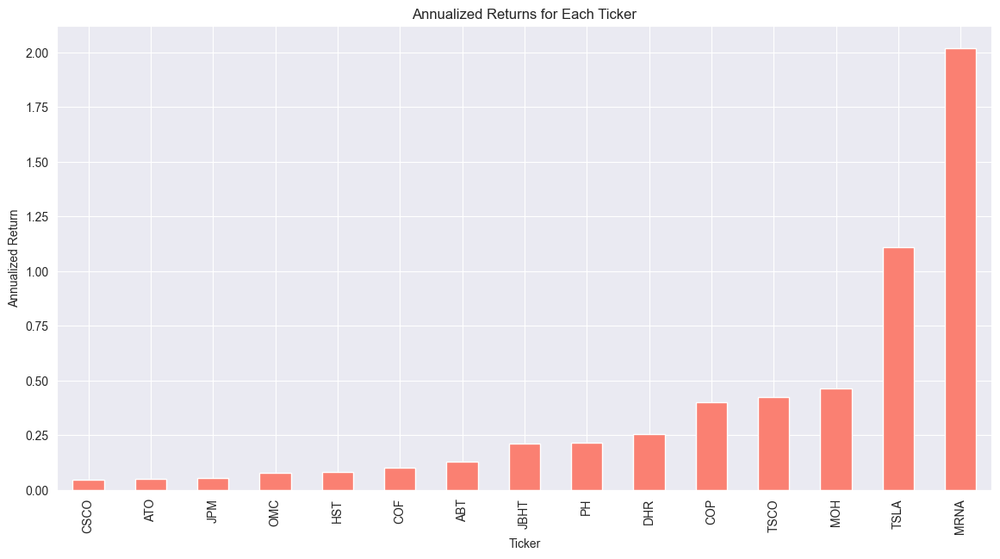

In [66]:
plt.figure(figsize=(14, 7))
annualized_returns.sort_values().plot(kind='bar', color='salmon')
plt.title('Annualized Returns for Each Ticker')
plt.xlabel('Ticker')
plt.ylabel('Annualized Return')
plt.show()

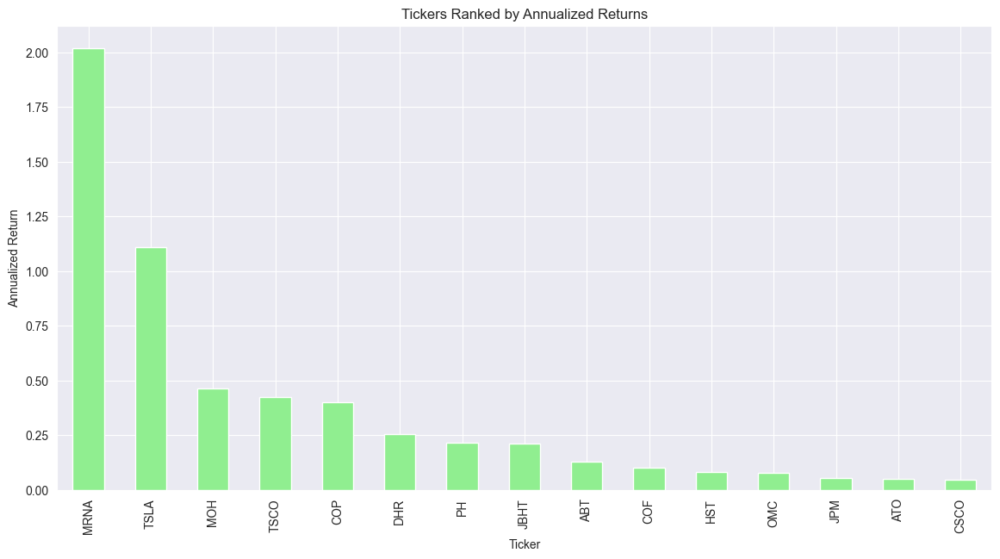

In [67]:
plt.figure(figsize=(14, 7))
ranked_tickers.plot(kind='bar', color='lightgreen')
plt.title('Tickers Ranked by Annualized Returns')
plt.xlabel('Ticker')
plt.ylabel('Annualized Return')
plt.show()

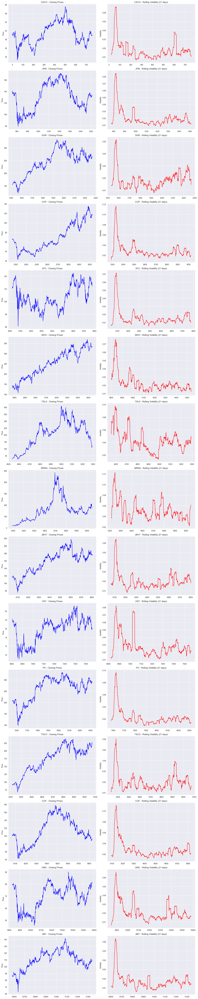

In [70]:
data['Rolling Volatility'] = data.groupby('Ticker')['Returns'].rolling(window=21).std().reset_index(0, drop=True)
tickers = data['Ticker'].unique()
plt.figure(figsize=(15, 5 * len(tickers)))

for idx, ticker in enumerate(tickers, 1):
    ticker_data = data[data['Ticker'] == ticker]
    plt.subplot(len(tickers), 2, 2*idx - 1)
    ticker_data['Close'].plot(title=f"{ticker} - Closing Prices", color='blue')
    plt.ylabel('Price')
    plt.subplot(len(tickers), 2, 2*idx)
    ticker_data['Rolling Volatility'].plot(title=f"{ticker} - Rolling Volatility (21 days)", color='red')
    plt.ylabel('Volatility')

plt.tight_layout()
plt.show()


# Wavelet Analysis model


Wavelet analysis is a powerful mathematical tool used for the decomposition and analysis of signals, including time series data. It's particularly useful for analyzing localized features of a signal, such as sudden changes or breaks, which traditional Fourier analysis might miss.

the main concepts are as follows:
 Decomposition: One of the primary uses of wavelets is to decompose a signal into different frequency components. This is achieved by projecting the signal onto a set of basis functions, which are derived from a mother wavelet by scaling and translating it.

Localization: Unlike Fourier transforms, which provide information only about the frequency content of a signal, wavelets give information about both time and frequency. This is useful for analyzing signals with non-stationary or time-varying characteristics.

Mother Wavelet: The choice of the mother wavelet, which is a brief oscillation with amplitude that starts from zero, grows, and then decays back to zero, is crucial. Different mother wavelets are suitable for different applications. Commonly used wavelets include Haar, Daubechies, and Morlet.

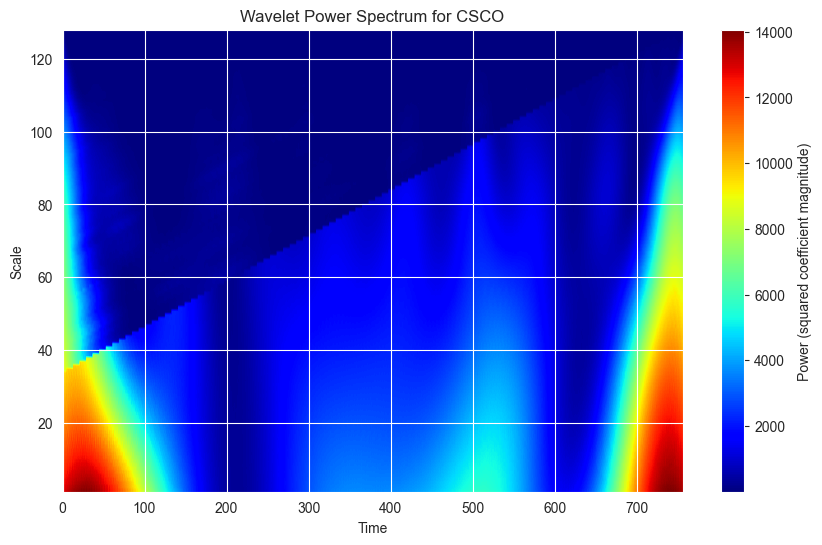

In [76]:
import numpy as np
import matplotlib.pyplot as plt
import pywt

csco_data = data[data['Ticker'] == 'CSCO']['Close'].values
scales = np.arange(1, 128)
coefficients, frequencies = pywt.cwt(csco_data, scales, 'cmor')

plt.figure(figsize=(10, 6))
plt.imshow(np.abs(coefficients)**2, aspect='auto', extent=[0, len(csco_data), 1, 128], cmap='jet')
plt.colorbar(label='Power (squared coefficient magnitude)')
plt.ylabel('Scale')
plt.xlabel('Time')
plt.title('Wavelet Power Spectrum for CSCO')
plt.show()

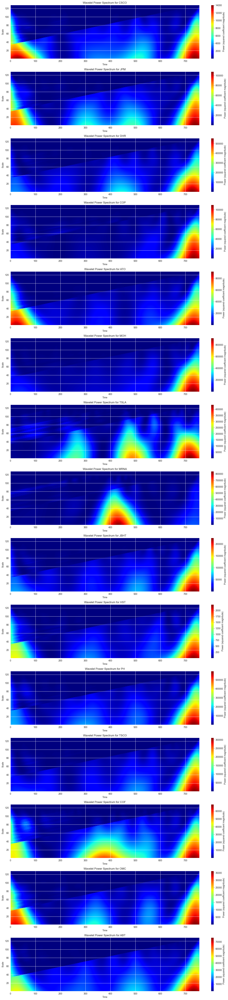

In [77]:
def plot_wavelet_spectrum(ticker_data, ticker_name):
    scales = np.arange(1, 128)
    coefficients, frequencies = pywt.cwt(ticker_data, scales, 'cmor')
    plt.imshow(np.abs(coefficients)**2, aspect='auto', extent=[0, len(ticker_data), 1, 128], cmap='jet')
    plt.colorbar(label='Power (squared coefficient magnitude)')
    plt.ylabel('Scale')
    plt.xlabel('Time')
    plt.title(f'Wavelet Power Spectrum for {ticker_name}')

plt.figure(figsize=(15, 60))
for idx, ticker in enumerate(unique_tickers, 1):
    plt.subplot(len(unique_tickers), 1, idx)
    ticker_data = data[data['Ticker'] == ticker]['Close'].values
    plot_wavelet_spectrum(ticker_data, ticker)
    
plt.tight_layout()
plt.show()

In [78]:
def aggregate_power(ticker_data):
    scales = np.arange(1, 128)
    coefficients, frequencies = pywt.cwt(ticker_data, scales, 'cmor')
    longer_scales_power = np.abs(coefficients[64:])**2
    return np.sum(longer_scales_power)

power_aggregation = {}
for ticker in unique_tickers:
    ticker_data = data[data['Ticker'] == ticker]['Close'].values
    power_aggregation[ticker] = aggregate_power(ticker_data)

sorted_tickers = sorted(power_aggregation.items(), key=lambda x: x[1], reverse=True)
sorted_tickers

[('MOH', 5655026391.089033),
 ('MRNA', 5379955552.672743),
 ('TSLA', 4886525150.580951),
 ('PH', 4839400431.447074),
 ('DHR', 4439175613.561407),
 ('TSCO', 2275761007.7565646),
 ('JBHT', 1763505742.8302567),
 ('JPM', 1245546173.789317),
 ('COF', 950126160.413911),
 ('ATO', 860537294.8353751),
 ('ABT', 770372211.0794592),
 ('COP', 606903052.6988981),
 ('OMC', 384359101.15458417),
 ('CSCO', 162764553.6086229),
 ('HST', 19988094.74608621)]

# SVM Model time series - Bonus (bema ze tomech?)

Support Vector Machines (SVM) are traditionally used for classification tasks, but they can be adapted for regression and, consequently, for time series forecasting. When SVMs are used for regression, they are commonly referred to as Support Vector Regression (SVR).

In [80]:
data = pd.read_csv('new_combined_df.csv')

In [81]:
missing_values = data.isnull().sum()
missing_values

Date                0
Close               0
Ticker              0
MA for 10 days    135
MA for 20 days    285
MA for 50 days    735
dtype: int64

In [82]:
unique_tickers = data['Ticker'].unique()
sample_ticker_data = data[data['Ticker'] == unique_tickers[0]].head(60)
unique_tickers, sample_ticker_data

(array(['CSCO', 'JPM', 'DHR', 'COP', 'ATO', 'MOH', 'TSLA', 'MRNA', 'JBHT',
        'HST', 'PH', 'TSCO', 'COF', 'OMC', 'ABT'], dtype=object),
           Date      Close Ticker  MA for 10 days  MA for 20 days  \
 0   2020-01-02  48.419998   CSCO             NaN             NaN   
 1   2020-01-03  47.630001   CSCO             NaN             NaN   
 2   2020-01-06  47.799999   CSCO             NaN             NaN   
 3   2020-01-07  47.490002   CSCO             NaN             NaN   
 4   2020-01-08  47.520000   CSCO             NaN             NaN   
 5   2020-01-09  47.320000   CSCO             NaN             NaN   
 6   2020-01-10  47.130001   CSCO             NaN             NaN   
 7   2020-01-13  47.970001   CSCO             NaN             NaN   
 8   2020-01-14  47.790001   CSCO             NaN             NaN   
 9   2020-01-15  48.009998   CSCO       47.708000             NaN   
 10  2020-01-16  49.049999   CSCO       47.771000             NaN   
 11  2020-01-17  49.020000   CS

In [83]:
for ticker in unique_tickers:
    data.loc[data['Ticker'] == ticker] = data.loc[data['Ticker'] == ticker].fillna(method='ffill').fillna(method='bfill')

remaining_missing_values = data.isnull().sum()
remaining_missing_values

Date              0
Close             0
Ticker            0
MA for 10 days    0
MA for 20 days    0
MA for 50 days    0
dtype: int64

In [84]:
num_lags = 5
for ticker in unique_tickers:
    ticker_data = data[data['Ticker'] == ticker]
    for i in range(1, num_lags + 1):
        column_name = f"lag_{i}"
        ticker_data[column_name] = ticker_data['Close'].shift(i)
    data.loc[data['Ticker'] == ticker] = ticker_data

data = data.dropna().reset_index(drop=True)
data.head()

,Date,Close,Ticker,MA for 10 days,MA for 20 days,MA for 50 days
0,2020-01-02,48.419998,CSCO,47.708,48.02,45.4106
1,2020-01-03,47.630001,CSCO,47.708,48.02,45.4106
2,2020-01-06,47.799999,CSCO,47.708,48.02,45.4106
3,2020-01-07,47.490002,CSCO,47.708,48.02,45.4106
4,2020-01-08,47.520000,CSCO,47.708,48.02,45.4106


In [85]:
rmse_dict = {}

for ticker in unique_tickers:
    ticker_data = data[data['Ticker'] == ticker]
    train_size = int(0.8 * len(ticker_data))
    train, test = ticker_data.iloc[:train_size], ticker_data.iloc[train_size:]    
    X_train = train.drop(['Date', 'Close', 'Ticker'], axis=1)
    y_train = train['Close']
    X_test = test.drop(['Date', 'Close', 'Ticker'], axis=1)
    y_test = test['Close']
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    model = SVR(kernel='linear')
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    rmse = sqrt(mean_squared_error(y_test, y_pred))
    rmse_dict[ticker] = rmse

rmse_dict

{'CSCO': 1.0820048681554322,
 'JPM': 4.1529406358157965,
 'DHR': 9.085933822917582,
 'COP': 5.4885906604538635,
 'ATO': 2.880424907901234,
 'MOH': 12.361362743278995,
 'TSLA': 19.04937952596154,
 'MRNA': 11.888236350139861,
 'JBHT': 5.402898063469858,
 'HST': 0.7922604774102044,
 'PH': 10.958507494690775,
 'TSCO': 6.1027756404844045,
 'COF': 4.760399587291112,
 'OMC': 1.9906649392323623,
 'ABT': 2.7839891375104764}

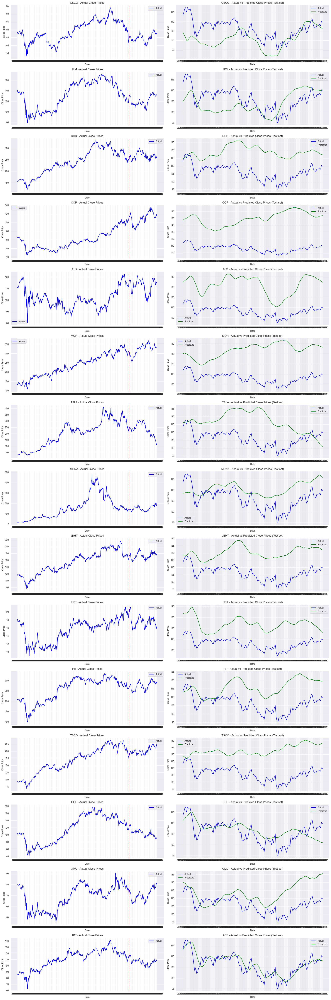

In [86]:
plt.figure(figsize=(20, 4 * len(unique_tickers)))

for idx, ticker in enumerate(unique_tickers):
    ticker_data = data[data['Ticker'] == ticker]
    train_size = int(0.8 * len(ticker_data))
    train, test = ticker_data.iloc[:train_size], ticker_data.iloc[train_size:]
    X_train = train.drop(['Date', 'Close', 'Ticker'], axis=1)
    X_test = test.drop(['Date', 'Close', 'Ticker'], axis=1)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    y_pred = model.predict(X_test_scaled)

    plt.subplot(len(unique_tickers), 2, 2*idx + 1)
    plt.plot(ticker_data['Date'], ticker_data['Close'], label="Actual", color="blue")
    plt.axvline(x=ticker_data.iloc[train_size]['Date'], color='red', linestyle='--')
    plt.title(f"{ticker} - Actual Close Prices")
    plt.xlabel("Date")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid(True)
    
    plt.subplot(len(unique_tickers), 2, 2*idx + 2)
    plt.plot(test['Date'], y_test, label="Actual", color="blue")
    plt.plot(test['Date'], y_pred, label="Predicted", color="green")
    plt.title(f"{ticker} - Actual vs Predicted Close Prices (Test set)")
    plt.xlabel("Date")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

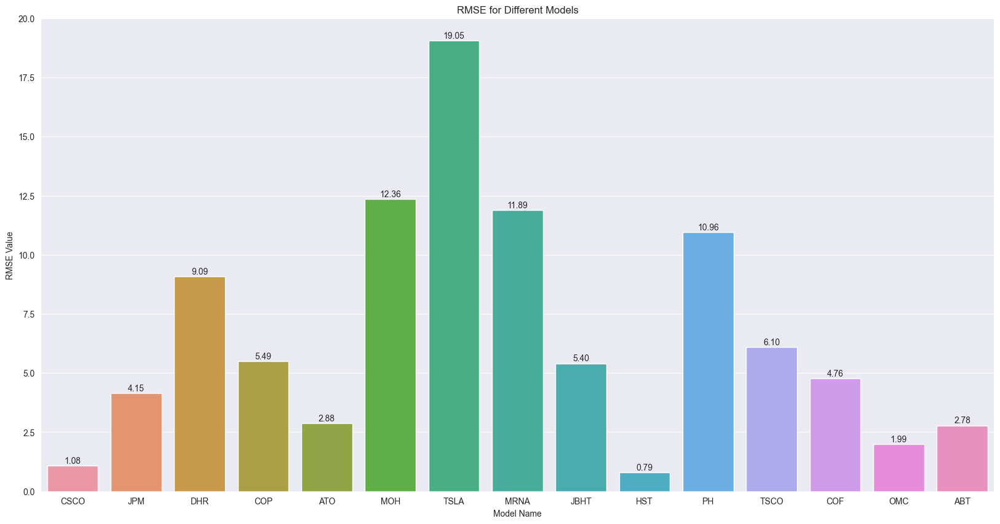

In [96]:
sns.set_style('darkgrid')
plt.figure(figsize=(20, 10))
ax = sns.barplot(x=list(rmse_dict.keys()), y=list(rmse_dict.values()))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 0.1,
            '{:1.2f}'.format(height),
            ha="center")

plt.title('RMSE for Different Models')
plt.ylabel('RMSE Value')
plt.xlabel('Model Name')
plt.show()